# **Detección de Distanciamiento Físico vía YOLOv5 : Parte 03**

In [2]:
import torch
from IPython.display import Image, clear_output
clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
4/3wG8tRyf_Es3T-mK4fGWplwde7NFAkc2yS0tzSe1tvVmzNuRGIaGO2I
Mounted at /content/gdrive


Los cambios en YOLOv5 se producen el "detect.py" y "util/general.py". En "detect.py" se inserta la función "plot_dots_on_people" y "distancing" que permite dibujar en punto centroide en lugar de dibujar los cuadros delimitadores y dibujar la linea de alerta, si fuera el caso, respectivamente.

En "util/general.py" se implementa los método "plot_dots_on_people" y "distancing".

In [4]:
%cd /content/
%rm -rf /content/yolov5
import shutil
shutil.copytree("/content/gdrive/My Drive/Yolo5Notebooks/yolov5/","/content/yolov5")
%cd yolov5
%pwd

/content
/content/yolov5


'/content/yolov5'

## **Inferencia, Detección de Personas y Distanciamiento Físico en Imágenes**

In [6]:
!python detect.py --weights "/content/gdrive/My Drive/Yolo5Notebooks/runs1000/exp0_yolov5x_person/weights/best.pt" \
  --img-size 640 --conf-thres 0.4 --source "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/', update=False, view_img=False, weights=['/content/gdrive/My Drive/Yolo5Notebooks/runs1000/exp0_yolov5x_person/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 284 layers, 8.83906e+07 parameters, 8.45317e+07 gradients
image 1/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo01.jpg: 448x640 6 Persons, Done. (0.055s)
image 2/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo02.jpg: 384x640 6 Persons, Done. (0.044s)
image 3/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo03.jpg: 512x640 4 Persons, Done. (0.050s)
image 4/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo04.jpg: 384x640 6 Persons, Done. (0.044s)
imag

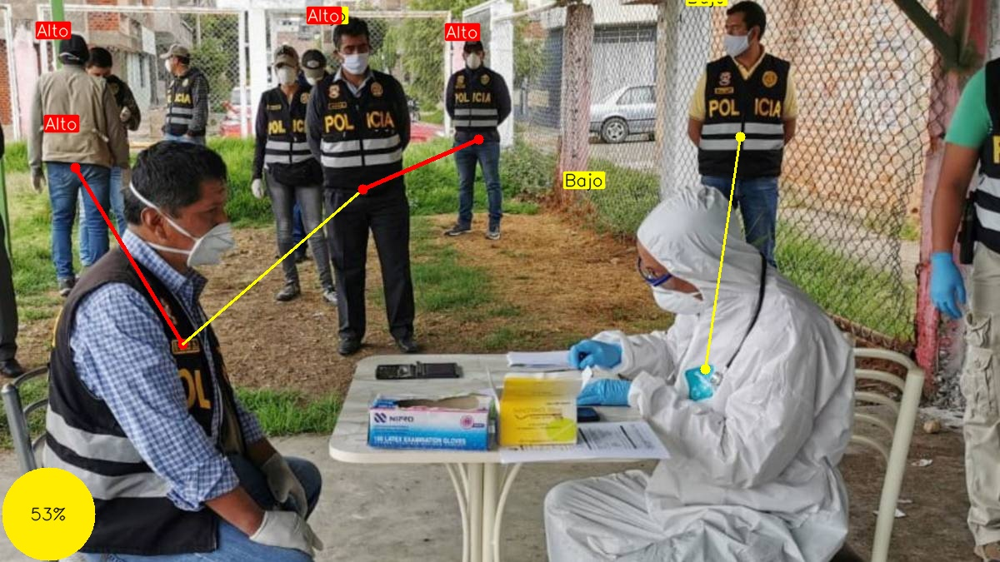

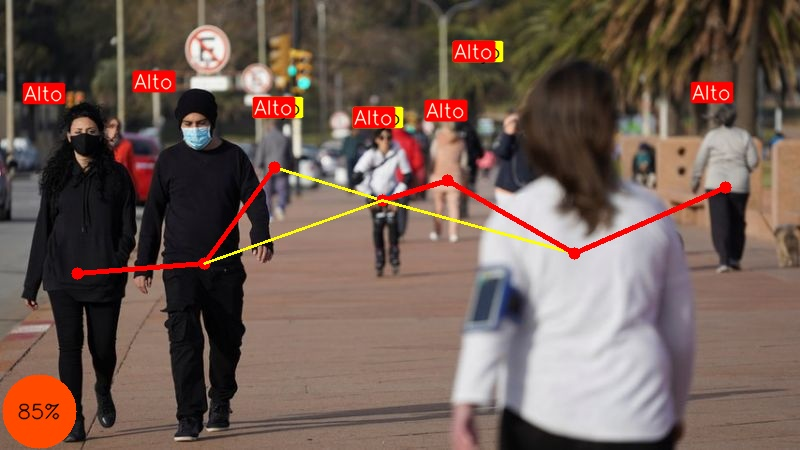

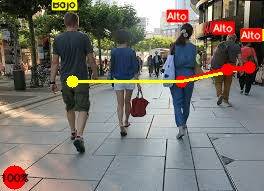

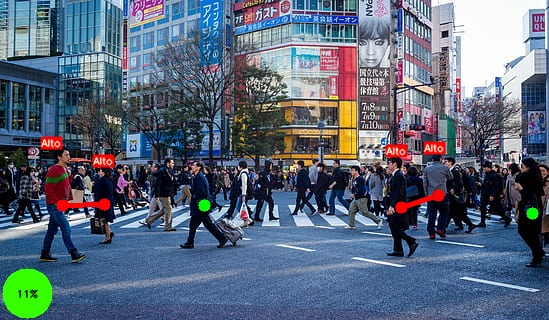

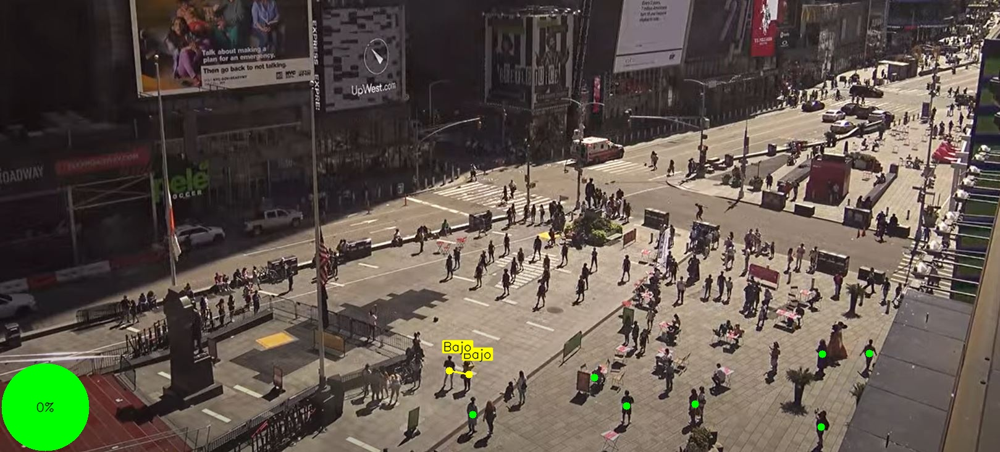

...

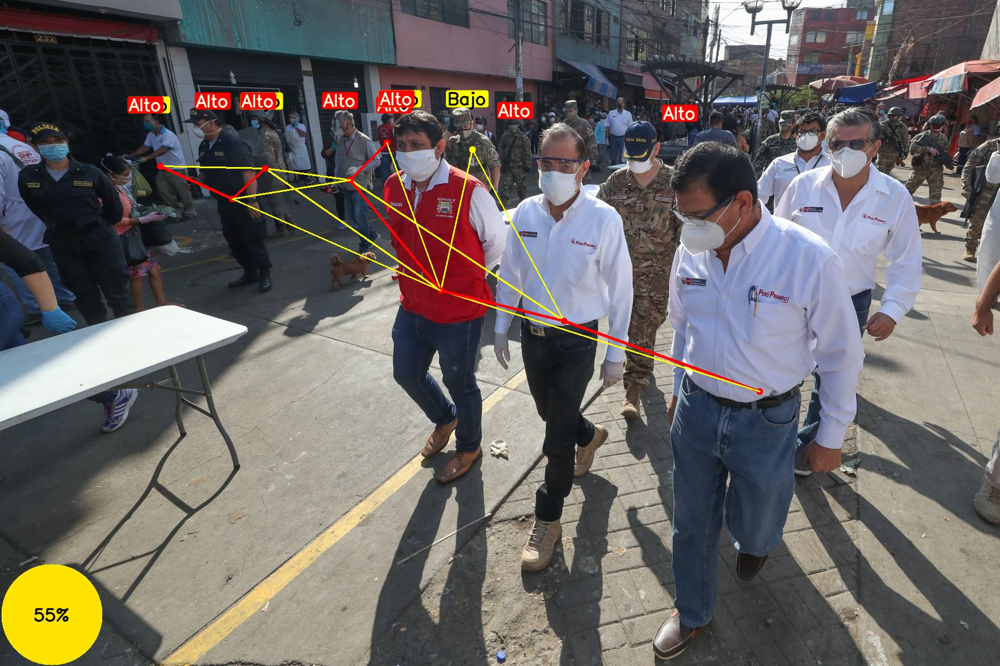

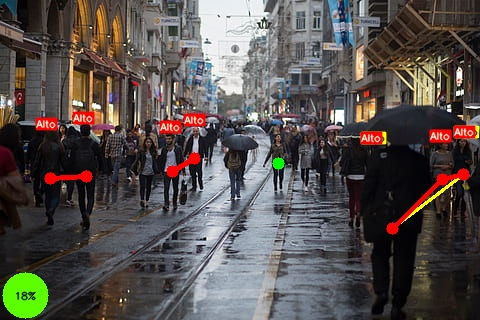

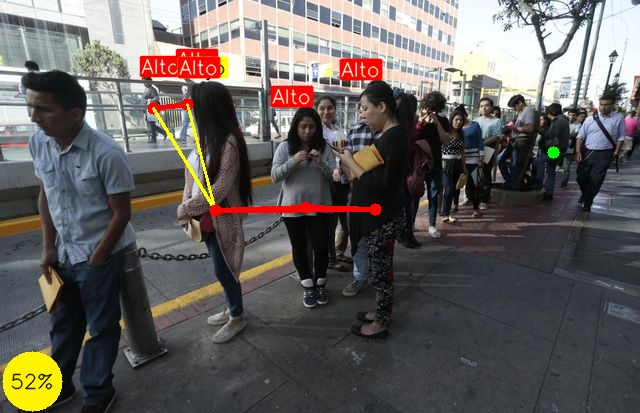

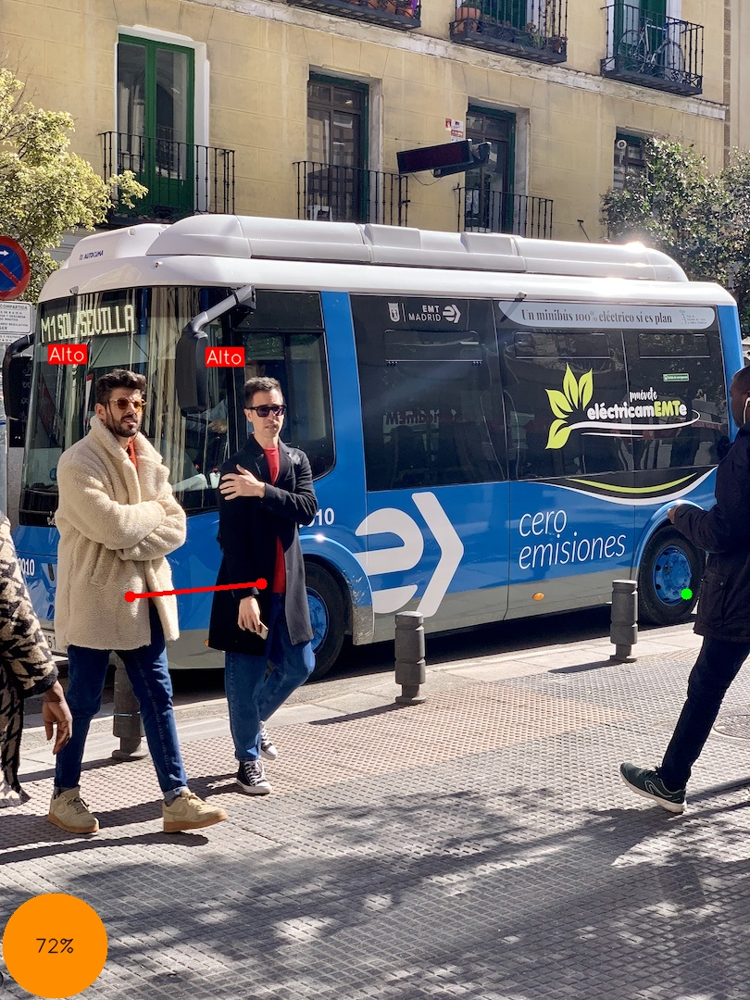

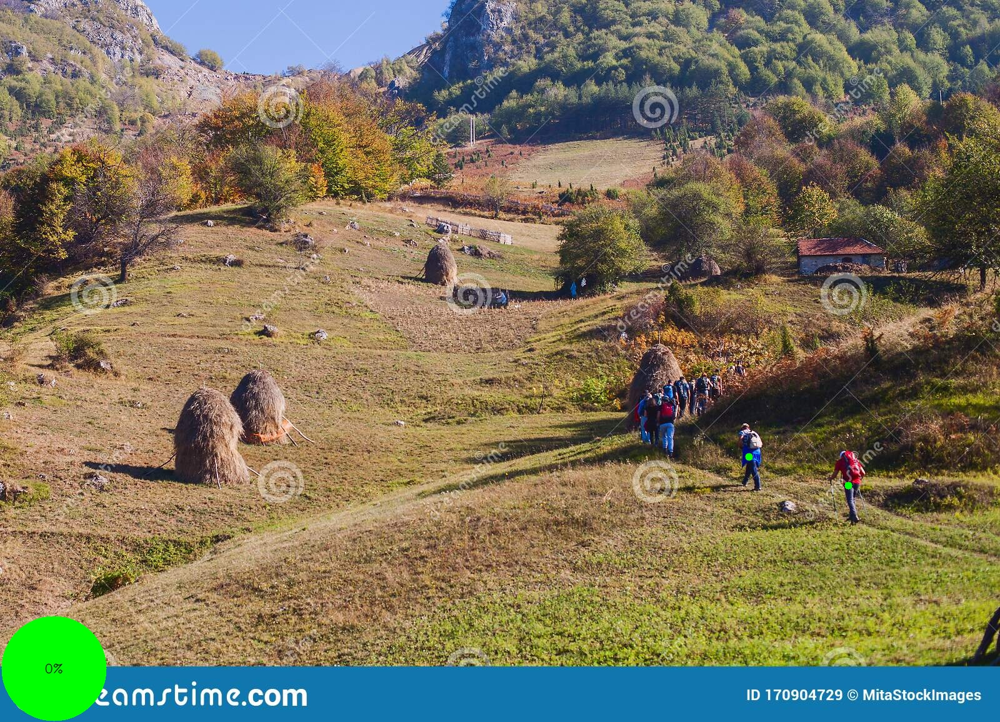

In [7]:
# Mostrar la infercia de las imágenes de prueba.

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [8]:
!python detect.py --weights yolov5x.pt --source "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/images"

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/gdrive/My Drive/Yolo5Notebooks/InferImages/images', update=False, view_img=False, weights=['yolov5x.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 284 layers, 8.89222e+07 parameters, 8.45317e+07 gradients
image 1/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo01.jpg: 448x640 17 persons, 1 backpacks, 1 handbags, 1 books, Done. (0.049s)
image 2/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo02.jpg: 384x640 10 persons, 1 cars, 2 chairs, 1 dining tables, Done. (0.034s)
image 3/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo03.jpg: 512x640 7 persons, 3 handbags, Done. (0.038s)
image 4/13 /content/gdrive/My Drive/Yolo5Notebooks/InferImages/images/grupo04.jpg: 384x640 13 persons, 1 handbags

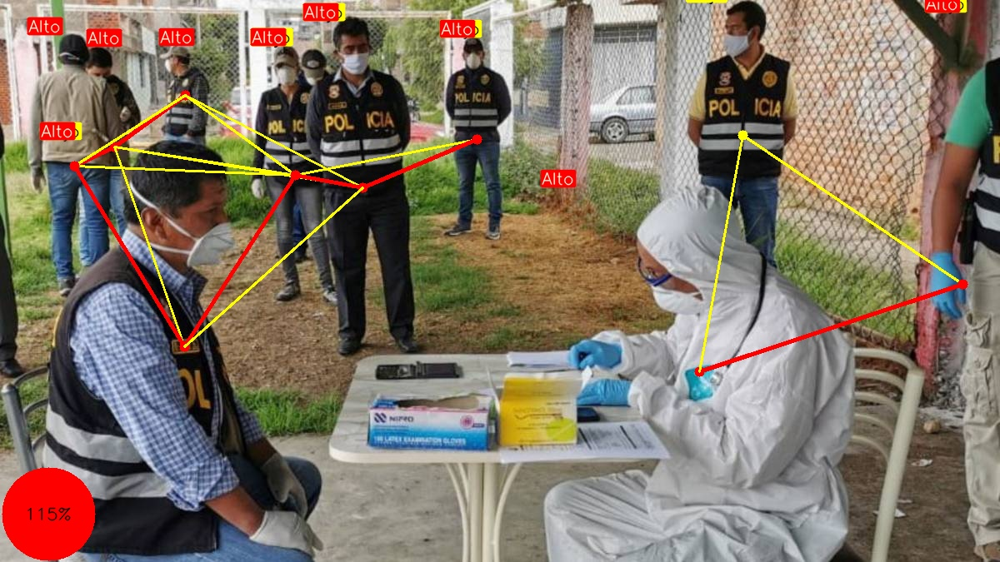

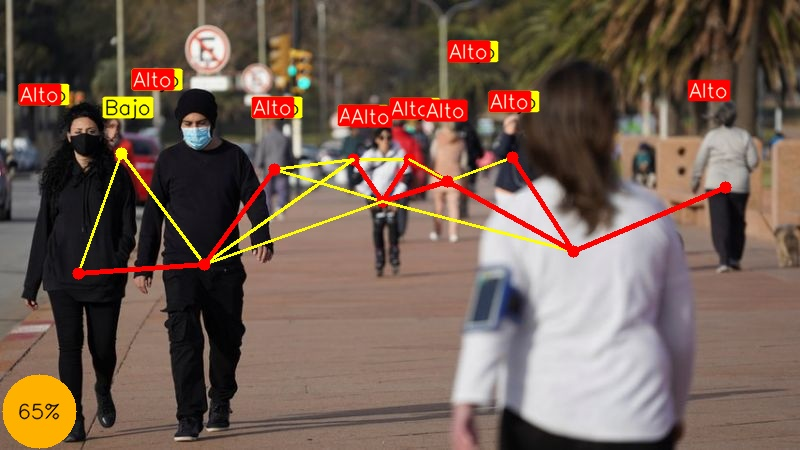

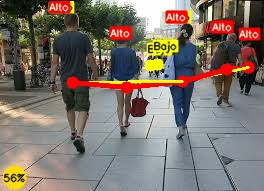

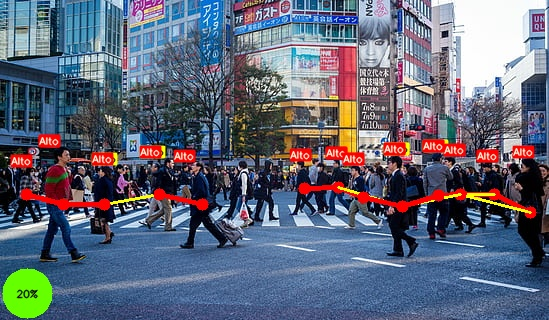

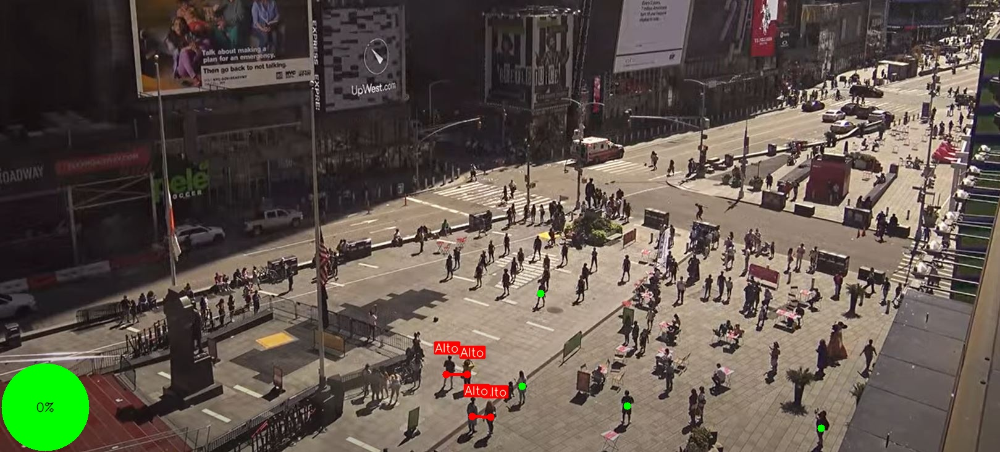

...

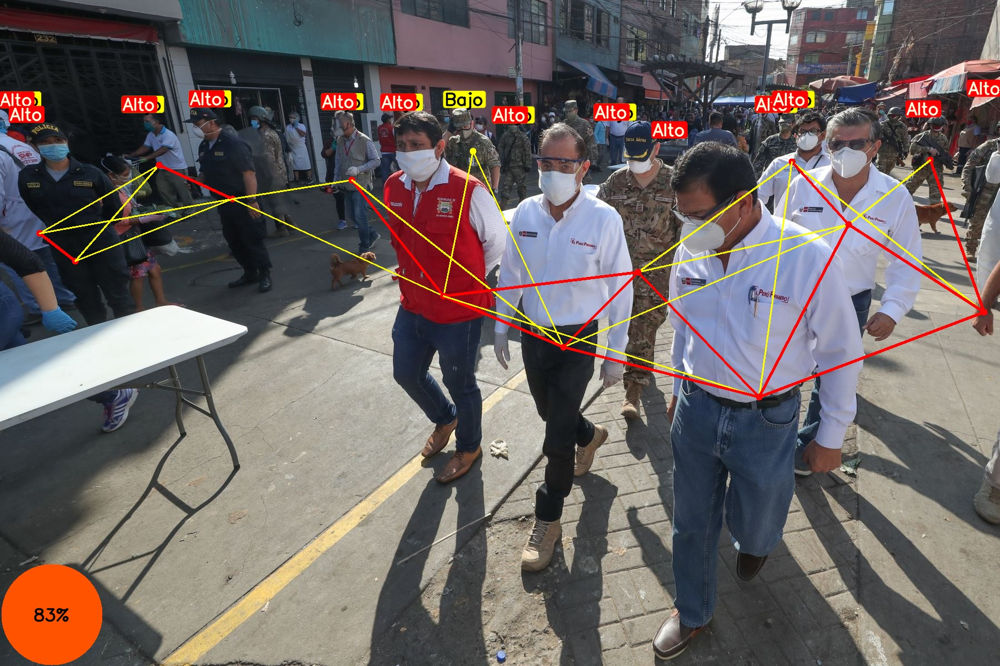

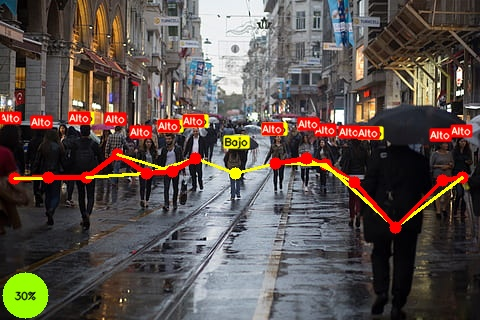

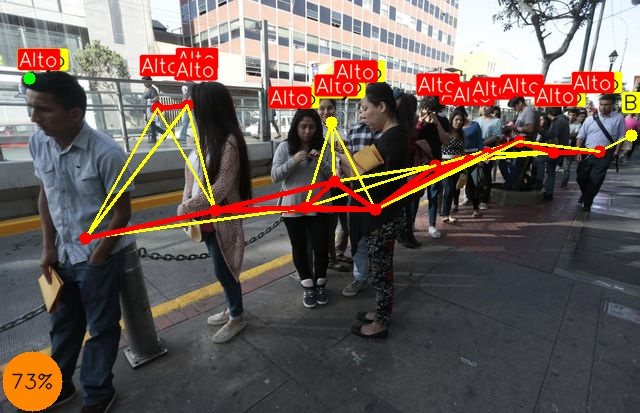

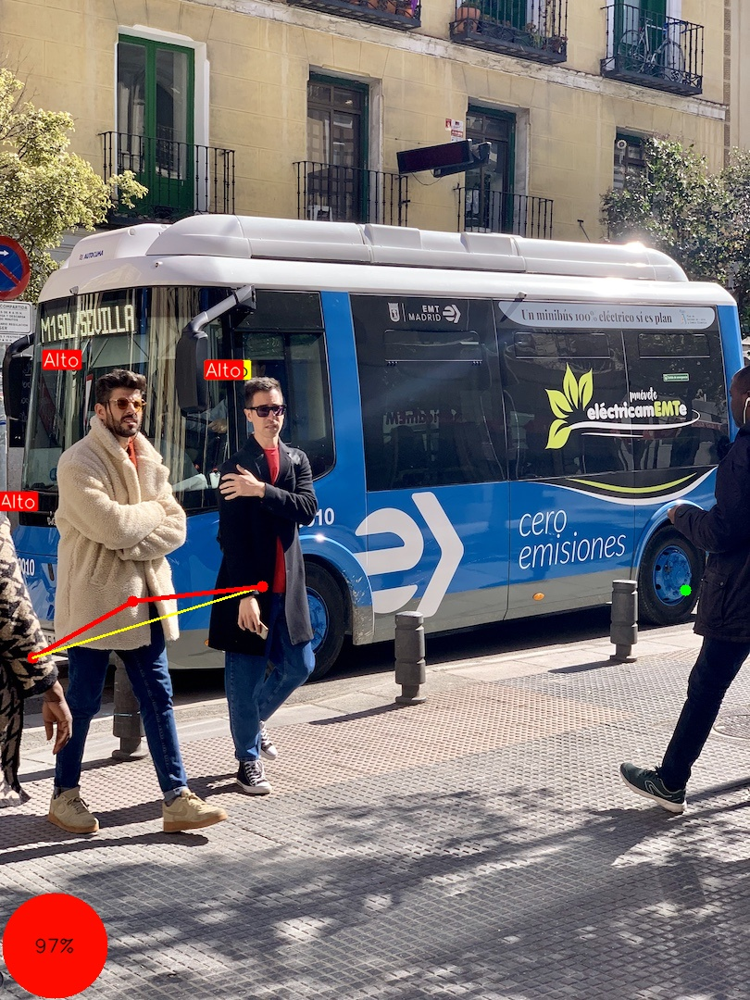

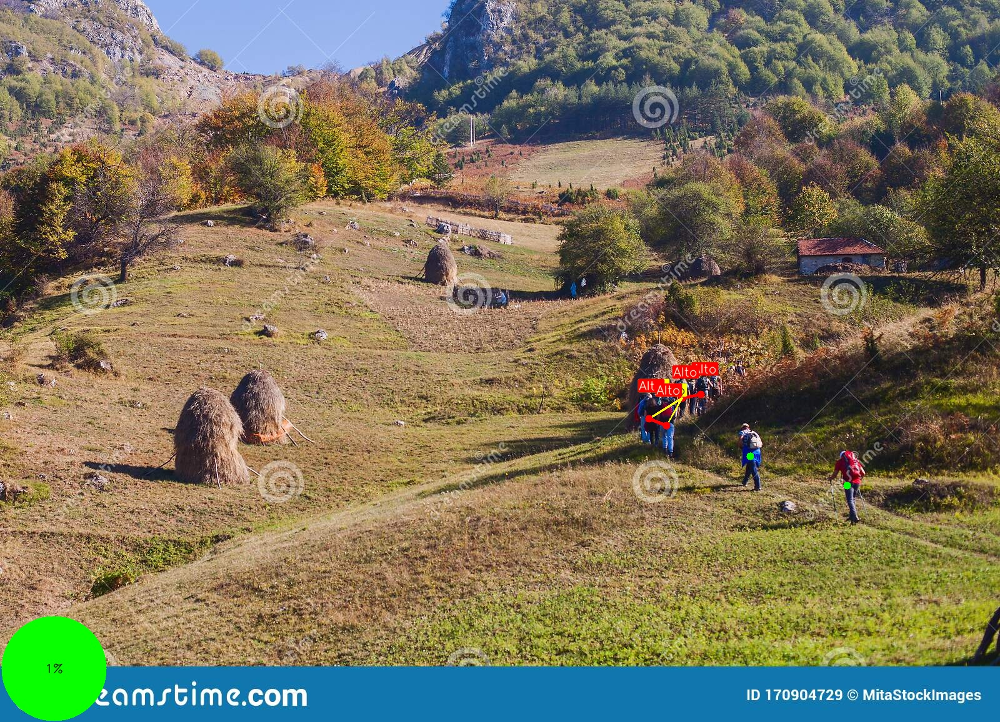

In [9]:
for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [10]:
!rm -rf "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputimages/"
import shutil
shutil.copytree("inference/output/","/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputimages/")

'/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputimages/'

## **Inferencia, Detección de Personas y Distanciamiento Físico en Videos**

In [11]:
#!python detect.py --weights "/content/gdrive/My Drive/Yolo5Notebooks/runs/exp0_yolov5x_person/weights/best.pt"  --source "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/"
!python detect.py --weights yolov5x.pt --source "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/"

Se han truncado las últimas 5000 líneas del flujo de salida.
video 1/7 (2488/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 14 persons, 1 cars, 4 backpacks, 3 handbags, Done. (0.027s)
video 1/7 (2489/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 13 persons, 1 cars, 3 backpacks, 3 handbags, Done. (0.023s)
video 1/7 (2490/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 15 persons, 1 cars, 4 backpacks, 3 handbags, Done. (0.022s)
video 1/7 (2491/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 15 persons, 5 backpacks, 1 handbags, Done. (0.022s)
video 1/7 (2492/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 15 persons, 5 backpacks, 2 handbags, Done. (0.023s)
video 1/7 (2493/3721) /content/gdrive/My Drive/Yolo5Notebooks/InferImages/videos/video01.mp4: 384x640 14 persons, 5 backpacks, 3 handbags, Done. 

In [12]:
!rm -rf "/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputvideos/"
import shutil
shutil.copytree("inference/output/","/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputvideos/")

'/content/gdrive/My Drive/Yolo5Notebooks/InferImages/outputvideos/'